# Traffic Sign Detection with Faster RCNN

### 1) Data Preparation

In [ ]:
import os
import numpy as np
import pandas as pd
from glob import glob
import cv2
import torch
from torch.utils import data
from PIL import Image
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt

In [ ]:
txt = np.genfromtxt('train/gt.txt',delimiter =';', dtype= None,encoding=None)

#Creating a dictionary with image names as key and annotations as value
dic ={}
for i in range (0,len(txt)):
    #Image name is first element of annotation file
    img_name = txt[i][0]
    # 4 Coordinates
    target = [txt[i][1],txt[i][2],txt[i][3],txt[i][4],txt[i][5]]
    #Last element is the class number
    clas = txt[i][-1]
    #If multiple objects, store coordinates and classes as list of lists
    if(img_name in dic):
        dic[img_name].append(target)
    else:
        dic[img_name] = [target]
print(dic['00001.ppm'])
print("Number of Images: " + str(len(dic)))

#### Data Distribution

From the plot below, it is evident that the distribution of data is not equal. Some classes have very few examples.

In [ ]:
#Data Distribution

cls_lst = {}

for i in dic:
    for j in dic[i][:]:
        #print(len(dic[i]))
        for k in range(len(dic[i])):
            clss = dic[i][:][k][-1]
            if clss in cls_lst:
                cls_lst[clss] += 1
            else:
                cls_lst[clss] = 1
                
print(cls_lst)

xx = []
yy = []
for i in cls_lst:
    xx.append(str(i))
    yy.append(cls_lst[i])

x_pos = [i for i, _ in enumerate(xx)]

plt.bar(x_pos, yy, color='green')
plt.xlabel("Class Number")
plt.ylabel("Number of Examples")
plt.title("GTSDB")
#plt.figure(figsize=(30,30))
plt.xticks(x_pos, xx)

plt.show()

In [ ]:
#Copy only files that are annotated in the gt.txt to imagesf
import shutil

pt = glob('./train/images/*.ppm')

len(pt)
#Copying into new directory
for i in range(len(dic)):
    ofile = r'./train/images/{}'.format(list(dic)[i])
    target = r'./train/imagesf/{}'.format(list(dic)[i])
    shutil.copyfile(ofile, target)
#Check if len(dic) == number of images in folder
print(len(glob('./train/imagesf/*.ppm')))
len(dic)

In [ ]:
class myDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "imagesf"))))
 
    def __getitem__(self, idx):
        # Load image path
        img_path = os.path.join(self.root, "imagesf", self.imgs[idx])
        #Load image as PIL
        img = Image.open(img_path).convert("RGB")        
        # Get objects in the image
        objects = dic[self.imgs[idx]]
        # Get bounding box coordinates for each object in image
        boxes = []
        labels = []
        for obj in objects:
            #print(idx, obj[-1], self.imgs)
            name = obj[-1]
            labels.append(np.int(name))
            #Get bounding box coordinates
            xmin = np.float(obj[0])
            ymin = np.float(obj[1])
            xmax = np.float(obj[2])
            ymax = np.float(obj[3])
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)        
 
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((len(objects),), dtype=torch.int64)
 
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd
 
        if self.transforms is not None:
            # Note that target (including bbox) is also transformed\enhanced here, which is different from transforms from torchvision import
            # Https://github.com/pytorch/vision/tree/master/references/detectionOfTransforms.pyThere are examples of target transformations when RandomHorizontalFlip
            img, target = self.transforms(img, target)
 
        return img, target
 
    def __len__(self):
        return len(self.imgs)

#### Data Augmentation using PyTorch's Transforms

The images are enhanced before being passed to the network. The images are transformed using the functions defined in the "transforms.py" file in [pytorch/vision](https://github.com/pytorch/vision/blob/master/references/detection/transforms.py).

The difference between original and transformed images are shown in the results.

In [ ]:
import utilss
import transforms as T
from engine import train_one_epoch, evaluate
# utils, transforms, engine were just downloadedUtils.py,transforms.py,engine.py
 
def get_transform(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
    transforms.append(T.ToTensor())
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        # 50% chance of flipping horizontally
        transforms.append(T.RandomHorizontalFlip(0.5))
 
    return T.Compose(transforms)

In [ ]:
from engine import train_one_epoch, evaluate
import utilss
import torch.nn as nn
os.environ['TORCH_HOME'] = './'

root = r'./train'

# Train on the GPU if available else CPU.
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# 44 classes = 43 + background
num_classes = 44
#Send the data to the myDataset class (Apply transformations, Get bbox, labels, objects)
dataset = myDataset(root, get_transform(train=True))
dataset_test = myDataset(root, get_transform(train=False))

# split the dataset in train and test set
# My dataset has 506 images, almost training validation 4:1
indices = torch.randperm(len(dataset)).tolist()
dataset = torch.utils.data.Subset(dataset, indices[:-100])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-100:])

# define training and validation data loaders
#collate_fn returns tuples of images and image annotations for every iteration.
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=2, shuffle=True, num_workers=4,
    collate_fn=utilss.collate_fn, pin_memory=True)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=2, shuffle=False, num_workers=4,
    collate_fn=utilss.collate_fn, pin_memory=True)

# Define model
#model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, progress=True, num_classes=num_classes, pretrained_backbone=True)
# OR model = get_object_detection_model(num_classes)
model = torch.load('./train.pkl')

#Use specific GPUs:
#model = nn.DataParallel(model, device_ids=[0,1,2,3]) #Remove this line if not necessary.

# Move the model to device
model.to(device)
##
print("Model loaded")

In [ ]:
from engine import train_one_epoch, evaluate
import utilss
from IPython.display import clear_output
import pickle


# Constructing the optimizer
params = [p for p in model.parameters() if p.requires_grad]

# SGD
optimizer = torch.optim.Adam(params, lr=0.0005,weight_decay=0.0005)

# Learning Rate Scheduler
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=1, T_mult=2)

# Training for no. of Epochs
num_epochs = 1000


losses = []
loss_box_reg = []
loss_rpn_box_reg = []
loss_classifier = []
loss_objectness = []

stat0 = []
stat1 = []
stat2 = []
stat3 = []
stat4 = []
stat5 = []
stat6 = []
stat7 = []
stat8 = []
stat9 = []
stat10 = []
stat11 = []


for epoch in range(num_epochs):
    # Engine.py's train_one_epoch function takes both images and targets. to(device)
    # Metrics (metric_logger) was returned by train_one_epoch() in engine.py to get losses
    metrics = train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=50)
    losses.append(float(str(metrics.meters['loss']).split(" ")[0]))
    loss_box_reg.append(float(str(metrics.meters['loss_box_reg']).split(" ")[0]))
    loss_rpn_box_reg.append(float(str(metrics.meters['loss_rpn_box_reg']).split(" ")[0]))
    loss_classifier.append(float(str(metrics.meters['loss_classifier']).split(" ")[0]))
    loss_objectness.append(float(str(metrics.meters['loss_objectness']).split(" ")[0]))
    
    # Update the learning rate
    lr_scheduler.step()

    # Evaluate on the test dataset
    # _ gives coco_evaL obj from coco_eval.py from CocoEvaluator()
    _, metric_logger = evaluate(model, data_loader_test, device=device)
    #Stat object is from pycocotools' self.stats in summarize()
    #https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocotools/cocoeval.py
    stat = _.coco_eval['bbox'].stats
    
    #Append all stats
    stat0.append(stat[0])
    stat1.append(stat[1])
    stat2.append(stat[2])
    stat3.append(stat[3])
    stat4.append(stat[4])
    stat5.append(stat[5])
    stat6.append(stat[6])
    stat7.append(stat[7])
    stat8.append(stat[8])
    stat9.append(stat[9])
    stat10.append(stat[10])
    stat11.append(stat[11])
    
    
    print('')
    print('==================================================')
    print('')

print("Done!")

In [ ]:
#Save the model
torch.save(model, r'./train.pkl')

torch.save(model.state_dict(), 'train.pth')
torch.save({
    'epoch' : epoch,
    "model_state_dict" : model.state_dict(),
    'optimizer_state_dict' : optimizer.state_dict(),
}, 'ckpt.pth')

<a id='plots'></a>

### 3) Evaluation

#### Plotting the Stats

All the metrics from COCO Evaluation are recorded and plotted below.
<br>
To understand them, refer to [COCO's Detection Evaluation](https://cocodataset.org/#detection-eval). </br>

True Positive (TP): When the IoU over predicted bounding box and ground truth is greater than or equal to the threshold.
False Positive (FP): When the IoU over predicted bounding box and ground truth is less than threshold.


Average Precision ($AP$) is the number of true positives in the resulting bounding boxes.
Average Recall ($AR$) is the proportion of true positives out of possible positives.


COCO Evaluation mentions that they make no distinction between AP and mAP, AR and mAP. The AP and AR are averaged over multiple IoU values. They have used 10 IoU thresholds of .50:.05:.95 (start from 0.5 to 0.95 with a step size of 0.05) instead of computing over a single IoU of .50. Averaging ensures better localization.

The size of objects (area = small, medium, large) is mesasured in number of pixels.



The following can be inferred from the stats of the last iteration:
1. The AP @ IoU=0.5:0.95 for area = large is 0.800 which means that when the model detects an object with large area, 80% of the time it matches the ground truth objects.

2. The AR @IoU=0.5:0.95 for area = large is 0.800 which means that the model detects 80% of objects with large area, correctly.

3. For area = medium and small, the model does not do well. This was probably caused by the small size of dataset and the insufficient number of examples for small and medium sized objects.

The following can be inferred from the loss plots:

1. $Loss Box Reg$ is the measure of how tightly the model predicted the bounding box around the true object. It can be observed that the model works well to fit the bbox tightly to the object.

2. $Loss RPN Box Reg$ measures the performance of network for retrieving the region proposals. The plot shows that further training or tweaking the hyperparameters may be required to decrease the loss. This may require more data to improve the results significantly.

3. $Loss Classifier$ measures the performance of the object classification for detected bounding boxes. The plot shows that the model performs well in classifying the objects in the detected bounding boxes.

4. $Loss Objectness$ measures the performance of network for retrieving bounding boxes which contain an object. We can infer that the model is detecting the object very well.

In [ ]:
r,c = 9,2
fig, ax = plt.subplots(nrows=r, ncols=c)
fig.set_figheight(40)
fig.set_figwidth(10)
fig.subplots_adjust(left=14,right=15, top=6, bottom=5, hspace=1, wspace=1)


ax1 = plt.subplot(r, c, 1)
ax1.set_title("Losses")
ax2 = plt.subplot(r, c, 2)
ax2.set_title("Loss Box Reg")
ax3 = plt.subplot(r, c, 3)
ax3.set_title("Loss RPN Box Reg")
ax4 = plt.subplot(r, c, 4)
ax4.set_title("Loss Classifier")
ax5 = plt.subplot(r, c, 5)
ax5.set_title("Loss Objectness")
ax6 = plt.subplot(r, c, 6)
ax6.set_title("(AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100")
ax7 = plt.subplot(r, c, 7)
ax7.set_title("(AP) @[ IoU=0.50      | area=   all | maxDets=100")
ax8 = plt.subplot(r, c, 8)
ax8.set_title("(AP) @[ IoU=0.75      | area=   all | maxDets=100")
ax9 = plt.subplot(r, c, 9)
ax9.set_title("(AP) @[ IoU=0.50:0.95 | area= small | maxDets=100")
ax10 = plt.subplot(r, c, 10)
ax10.set_title("(AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100")
ax11 = plt.subplot(r, c, 11)
ax11.set_title("(AP) @[ IoU=0.50:0.95 | area= large | maxDets=100")
ax12 = plt.subplot(r, c, 12)
ax12.set_title("(AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1")
ax13 = plt.subplot(r, c, 13)
ax13.set_title("(AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10")
ax14 = plt.subplot(r, c, 14)
ax14.set_title("(AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100")
ax15 = plt.subplot(r, c, 15)
ax15.set_title("(AR) @[ IoU=0.50:0.95 | area= small | maxDets=100")
ax16 = plt.subplot(r, c, 16)
ax16.set_title("(AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100")
ax17 = plt.subplot(r, c, 17)
ax17.set_title("(AR) @[ IoU=0.50:0.95 | area= large | maxDets=100")

ax1.plot(losses, 'b')
ax2.plot(loss_box_reg, 'b')
ax3.plot(loss_rpn_box_reg, 'b')
ax4.plot(loss_classifier, 'b')
ax5.plot(loss_objectness, 'b')
ax1.plot(losses, 'b')
ax2.plot(loss_box_reg, 'b')
ax3.plot(loss_rpn_box_reg, 'b')
ax4.plot(loss_classifier, 'b')
ax5.plot(loss_objectness, 'b')
ax6.plot(stat0, 'b')
ax7.plot(stat1, 'b')
ax8.plot(stat2, 'b')
ax9.plot(stat3, 'b')
ax10.plot(stat4, 'b')
ax11.plot(stat5, 'b')
ax12.plot(stat6, 'b')
ax13.plot(stat7, 'b')
ax14.plot(stat8, 'b')
ax15.plot(stat9, 'b')
ax16.plot(stat10, 'b')
ax17.plot(stat11, 'b')
plt.show()

In [ ]:
#Storing losses and stats in pickle format
import pickle

with open('vars1000.pickle', 'wb') as f:
    pickle.dump([losses, loss_box_reg, loss_rpn_box_reg, loss_classifier, loss_objectness, stat0, stat1, stat2, stat3,
 stat4, stat5, stat6, stat7, stat8, stat9, stat10, stat11], f)

In [ ]:
#Uncomment to :

#Load vars pickle file to calc mAP and other statistics
"""
with open('vars400.pickle', 'rb') as f:
    losses, loss_box_reg, loss_rpn_box_reg, loss_classifier, loss_objectness, stat0, stat1, stat2, stat3,
    stat4, stat5, stat6, stat7, stat8, stat9, stat10, stat11 = pickle.load(f)
"""

#### Drawing the bounding box for a prediction

The code below obtains the predictions made by the model in the format of a dictionary of boxes, labels and scores.

##### Non maximum suppression:
A number of proposals can be made by the model for the same object. We can filter the unwanted boxes by using Non-maximum suppression. Torchvision's library was used to perform NMS.

Next, the Image is converted to the a numpy array from tensor format and then to the RGB format.
A dictionary of class ID as keys and values as their string name is declared to display on the image.

Finally, for every bounding box, a rectangle box and class text is displayed in the predicted image. 

In [75]:
def showbbox(model, dataset):
    # The img entered is a tensor in the 0-1 range        
    plt.subplots_adjust(wspace=0, hspace=0)
    fig, axes = plt.subplots(10,sharex=True,sharey=True, figsize=(60, 60))
    model.eval()
    indexes = np.random.permutation(10)
    for i in range(10):
        img, _ = dataset[indexes[i]]
        with torch.no_grad():
            '''
            prediction Like:
            [{'boxes': tensor([[1221.7869,  523.7036, 1272.7373,  575.1018],
            [ 192.8189,  527.5751,  240.7135,  589.8405],
            [ 197.3745,  538.7914,  235.9153,  572.1550],
            [ 195.1216,  533.9565,  238.6585,  578.0548],
            [ 194.0861,  517.0943,  238.0777,  582.4178]], device='cuda:0'), 
            'labels': tensor([7, 7, 7, 8, 5], device='cuda:0'), 
            'scores': tensor([0.9792, 0.9036, 0.2619, 0.2407, 0.0575], device='cuda:0')}]
            '''
            prediction = model([img.to(device)])

        b = prediction[0]['boxes']
        #print(b)
        s = prediction[0]['scores']
        #print(s)

        #Apply Non-maximum suppression:
        keep = torchvision.ops.nms(b,s,0.1)
        #print(keep)

        img = img.permute(1,2,0)  # C,H,W_H,W,C, for drawing
        img = (img * 255).byte().data.cpu()  # * 255, float to 0-255
        img = np.array(img)  # tensor → ndarray
        #Convert np array img to right format.
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #Class number coressponding to Classes
        classes = { 0:' Speed limit (20km/h)' ,
        1:' Speed limit (30km/h)' ,
        2:' Speed limit (50km/h)' ,
        3:' Speed limit (60km/h)' ,
        4:' Speed limit (70km/h)' ,
        5:' Speed limit (80km/h)' ,
        6:' End of speed limit (80km/h)' ,
        7:' Speed limit (100km/h)' ,
        8:' Speed limit (120km/h)' ,
        9:' No passing' ,
        10:' No passing veh over 3.5 tons' ,
        11:' Right-of-way at intersection' ,
        12:' Priority road' ,
        13:' Yield' ,
        14:' Stop' ,
        15:' No vehicles' ,
        16:' Veh > 3.5 tons prohibited' ,
        17:' No entry' ,
        18:' General caution' ,
        19:' Dangerous curve left' ,
        20:' Dangerous curve right' ,
        21:' Double curve' ,
        22:' Bumpy road' ,
        23:' Slippery road' ,
        24:' Road narrows on the right' ,
        25:' Road work' ,
        26:' Traffic signals' ,
        27:' Pedestrians' ,
        28:' Children crossing' ,
        29:' Bicycles crossing' ,
        30:' Beware of ice/snow' ,
        31:' Wild animals crossing' ,
        32:' End speed + passing limits' ,
        33:' Turn right ahead' ,
        34:' Turn left ahead' ,
        35:' Ahead only' ,
        36:' Go straight or right' ,
        37:' Go straight or left' ,
        38:' Keep right' ,
        39:' Keep left' ,
        40:' Roundabout mandatory' ,
        41:' End of no passing' ,
        42:' End no passing veh > 3.5 tons'  }


        for k in range(len(keep)):
            xmin = round(prediction[0]['boxes'][k][0].item())
            ymin = round(prediction[0]['boxes'][k][1].item())
            xmax = round(prediction[0]['boxes'][k][2].item())
            ymax = round(prediction[0]['boxes'][k][3].item())

            label = prediction[0]['labels'][k].item()

            #color = list(np.random.random(size=3)*256)
            colors = np.random.uniform(0, 255, size=(43, 3))

            if label in classes:
                pt1 = (xmin, ymin)
                pt2 = (xmax, ymax)
                score = prediction[0]['scores'][k].item()
                color = list(colors[label])
                cv2.rectangle(img, pt1, pt2, color, thickness=2)
                cv2.putText(img, classes[label]+"-"+str(round(score,2)), (xmin, ymin), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color,
                            thickness=2)
        axes[i].imshow(img)
        axes[i].axis("off")
    fig.tight_layout()
    fig.show()
    

print("Function Loaded")

Function Loaded


In [76]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

#### Testing the Model

/tmp/ipykernel_2967575/1189736291.py:21: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  labels.append(np.int(name))
/tmp/ipykernel_2967575/1189736291.py:23: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  xmin = np.float(obj[

<Figure size 640x480 with 0 Axes>

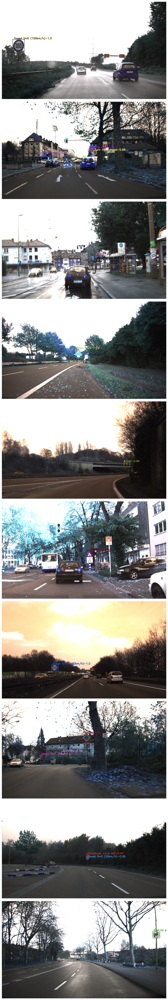

In [77]:
#Test the model:
showbbox(model, dataset_test)